# Data Sonification with Strauss

Strauss is a sonification framework for representing data as sound rather than visual plots. Instead of encoding information into axes, lines, or shapes, data is mapped into auditory dimensions such as pitch (frequency), volume (amplitude), duration, timbre, spatialization (left/right stereo position), and temporal sequencing.

This approach is particularly relevant for blind and visually impaired students because it removes dependence on visual interpretation entirely. Unlike traditional plotting libraries, Strauss does not produce a visual artifact by default. Instead, it produces a listenable representation of data structure and trends.


## Accessibility-oriented mapping

A correct accessibility-oriented implementation must ensure that every data dimension has a clearly defined auditory mapping, and that the mappings are consistent across datasets. Furthermore, every dataset must specify which variable controls pitch or volume, which variable controls time progression, and whether values are normalized or scaled.

The examples below use the same data utilizing **pitch mapping**, **volume mapping**, and **filter cutoff mapping**.

## Imports

In [1]:
import matplotlib.pyplot as plt
from strauss.sonification import Sonification
from strauss.sources import Objects
from strauss import channels
from strauss.score import Score
from strauss.generator import Synthesizer
import IPython.display as ipd
import os
from scipy.interpolate import interp1d
import numpy as np

## Create the example data

The same data-generation example used in this script is also presented in the Guidelines document.

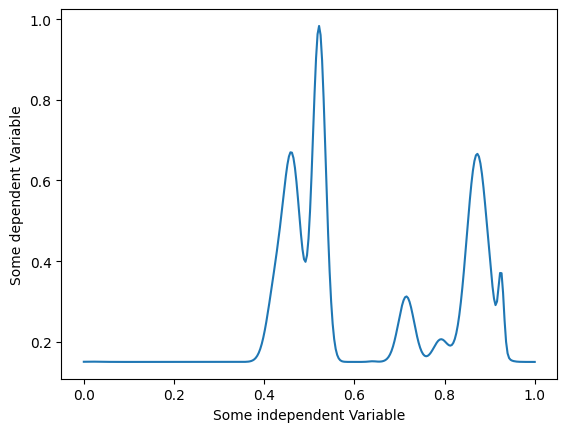

In [2]:
np.random.seed(0)
N = 300
x = np.linspace(0,1,N)
y = np.zeros(N)
gauss = lambda x, m, s: np.exp(-(x-m)**2/s)
for i in range(10):
    a,b,c = np.random.random(3)
    y += gauss(x, b, 1e-3*c) * a ** 3
y /= y.max()*1.2
y += 0.15
plt.plot(x,y)
plt.ylabel('Some dependent Variable')
plt.xlabel('Some independent Variable')
plt.show()

## Universal sonification parameters

In [3]:
system = "stereo" # Specify audio system
length = 15. # Length of the sonification in s
generator = Synthesizer()
generator.load_preset('pitch_mapper')
generator.preset_details('pitch_mapper')

pitch_mapper:
preset for mapping pitch_shift for 1D data sonification. the single triangle wave oscillator provides a balance between harmonic richness and the harshness of the sound to allow clear audiability over a large pitch range.



## 1. Pitch mapping

`time_evo` follows `x`, while the scaled dependent variable `y**0.7` controls `pitch_shift`.

100%|██████████| 1/1 [00:00<00:00, 13.06it/s]


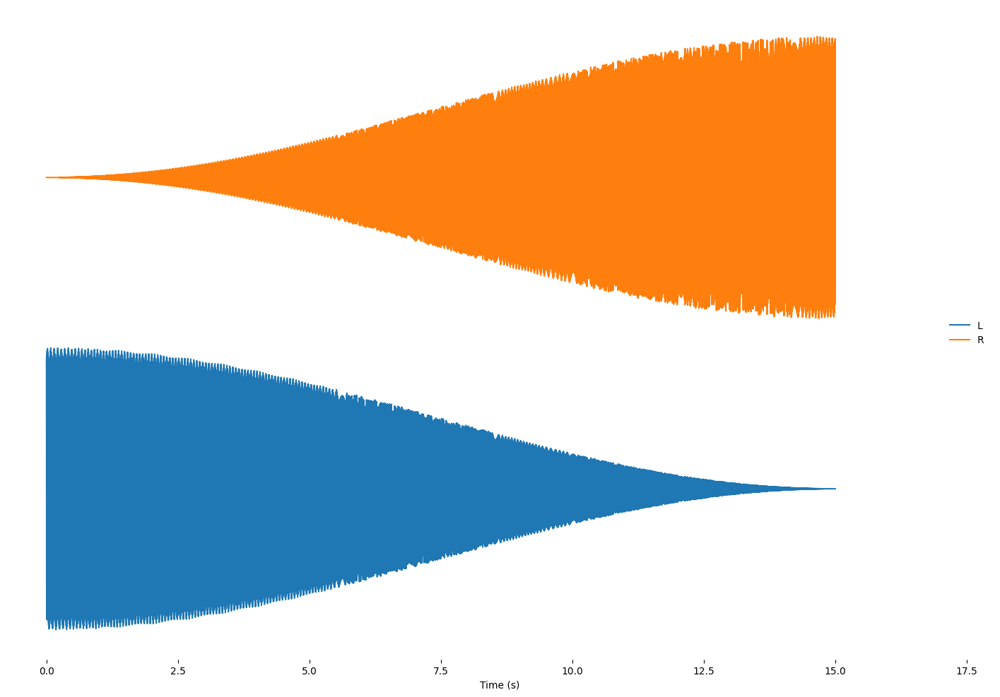

In [4]:
notes = [["A2"]]
score = Score(notes, length)
data = {'pitch':1.,
        'time_evo':x,
        'azimuth':(x*0.5+0.25) % 1,
        'polar':0.5,
        'pitch_shift':y**0.7}
sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions()
soni = Sonification(score, sources, generator, system)
soni.render()
soni.notebook_display()

## 2. Volume mapping

`time_evo` again follows `x`, while the scaled dependent variable `y**0.7` controls `volume`.

100%|██████████| 1/1 [00:00<00:00, 19.80it/s]


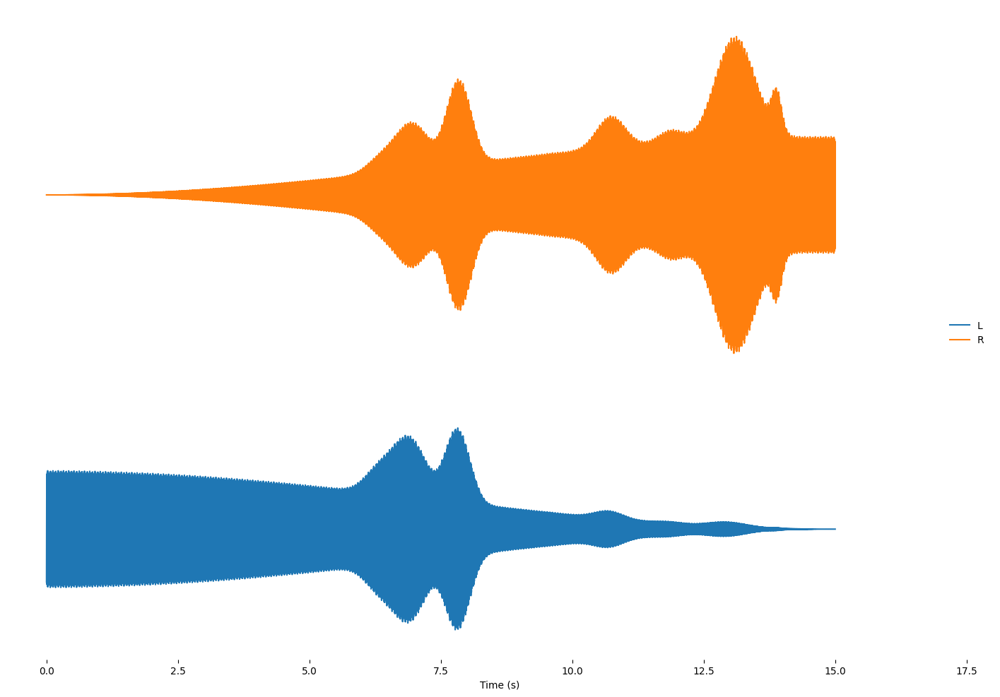

In [5]:
notes = [["A2"]]
score = Score(notes, length)
data = {'pitch':1.,
        'time_evo':x,
        'azimuth':(x*0.5+0.25) % 1,
        'polar':0.5,
        'volume':y**0.7}
sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions()
soni = Sonification(score, sources, generator, system)
soni.render()
soni.notebook_display()

## 3. Filter cutoff mapping

This example enables the synthesizer filter and maps the scaled dependent variable to `cutoff`.

100%|██████████| 4/4 [00:00<00:00,  6.90it/s]


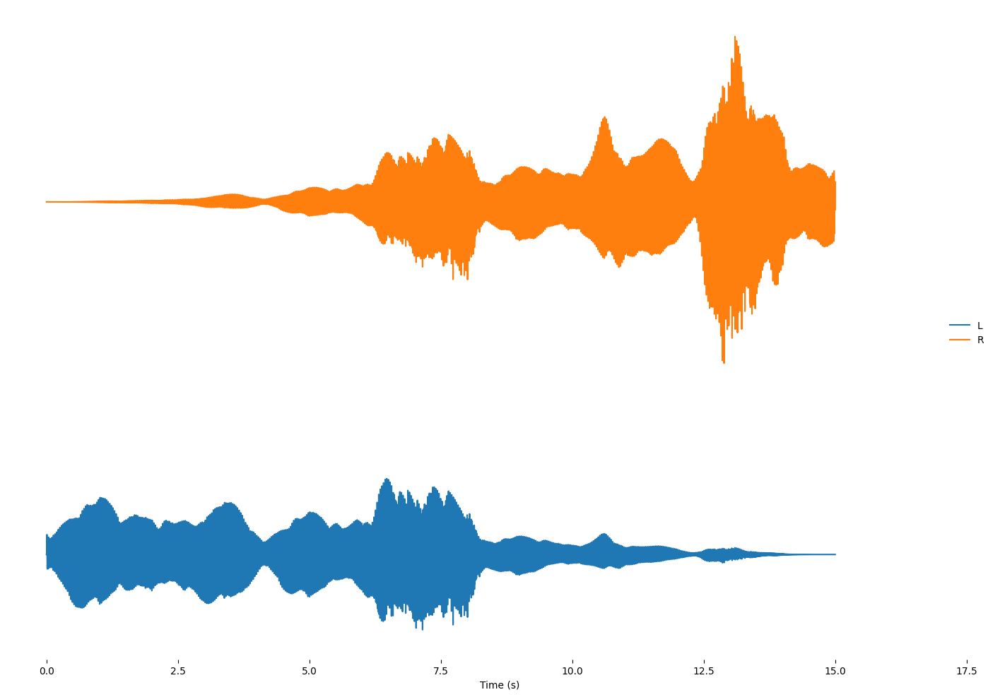

In [6]:
generator = Synthesizer()
generator.modify_preset({'filter':'on'})
notes = [["C2","G2","C3","G3"]]
score = Score(notes, length)
data = {'pitch':[0,1,2,3],
        'time_evo':[x]*4,
        'azimuth':[(x*0.5+0.25) % 1]*4,
        'polar':[0.5]*4,
        'cutoff':[y**0.8]*4}
sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions()
soni = Sonification(score, sources, generator, system)
soni.render()
soni.notebook_display()

## Interpretation

Strauss is a sonification framework where accessibility is not added after visualization but defined through explicit mappings between data variables and auditory channels using a Score-based architecture.